# Gesture Recognition
In this group project, you are going to build a 3D Conv model that will be able to predict the 5 gestures correctly. Please import the following libraries to get started.

## Installers

In [30]:
# !pip install keras
# !pip install tensorflow
# !pip install opencv-python
# !pip install matplotlib

  Using cached contourpy-1.2.0-cp312-cp312-win_amd64.whl.metadata (5.8 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ---------------------------------------- 0.0/162.6 kB ? eta -:--:--
     -- ------------------------------------- 10.2/162.6 kB ? eta -:--:--
     ----------------- --------------------- 71.7/162.6 kB 1.3 MB/s eta 0:00:01
     -------------------------------------- 162.6/162.6 kB 2.0 MB/s eta 0:00:00
  Using cached kiwisolver-1.4.5-cp312-cp312-win_amd64.whl.metadata (6.5 kB)
   ---------------------------------------- 0.0/7.6 MB ? eta -:--:--
    --------------------------------------- 0.1/7.6 MB 8.3 MB/s eta 0:00:01
   -- ------------------------------------- 0.5/7.6 MB 5.8 MB/s eta 0:00:02
   ---- ----------------------------------- 0.8/7.6 MB 6.4 MB/s eta 0:00:02
   ----- ---------------------------------- 1.1/7.6 MB 6.4 MB/s eta 0:00:02
   ------- -------------------------------- 1.4/7.6 MB 6.5 MB/s eta 0:00:01
   -------- -----------------

## Import Libraries

In [53]:
import numpy as np
import os
import cv2
from cv2 import imread, resize
import datetime
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

We set the random seed so that the results don't vary drastically.

In [31]:
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
import tensorflow as tf
tf.random.set_seed(30)

## Data Load
Read the folder names for training and validation

In [70]:
train_doc = np.random.permutation(open('Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('Project_data/val.csv').readlines())

#In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.
batch_size = 32 #TODO: experiment with the batch size

## Data Visualization

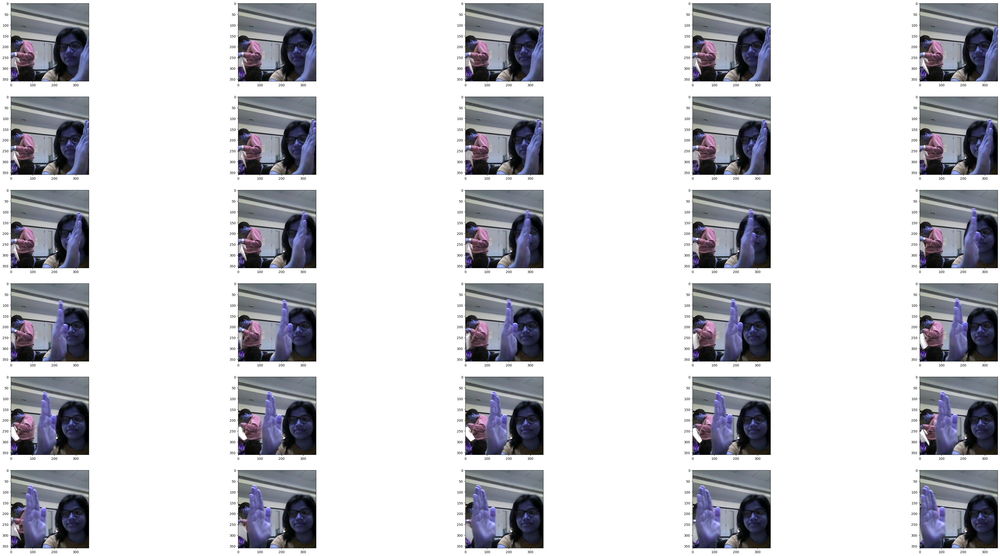

In [49]:
imageset1 = []
for img_path in glob.glob("Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/*.png"):
        imageset1.append(imread(img_path))

plt.figure(figsize=(60,30))
index = 0
for i, image in enumerate(imageset1):
    index += 1
    plt.subplot(6,5,index)
    plt.imshow(image)

In [50]:
# Resolutions of existing dataset

height, width, channels = imageset1[0].shape

# Print the resolution
print("Image Resolution:")
print("Width:", width)
print("Height:", height)

Image Resolution:
Width: 360
Height: 360


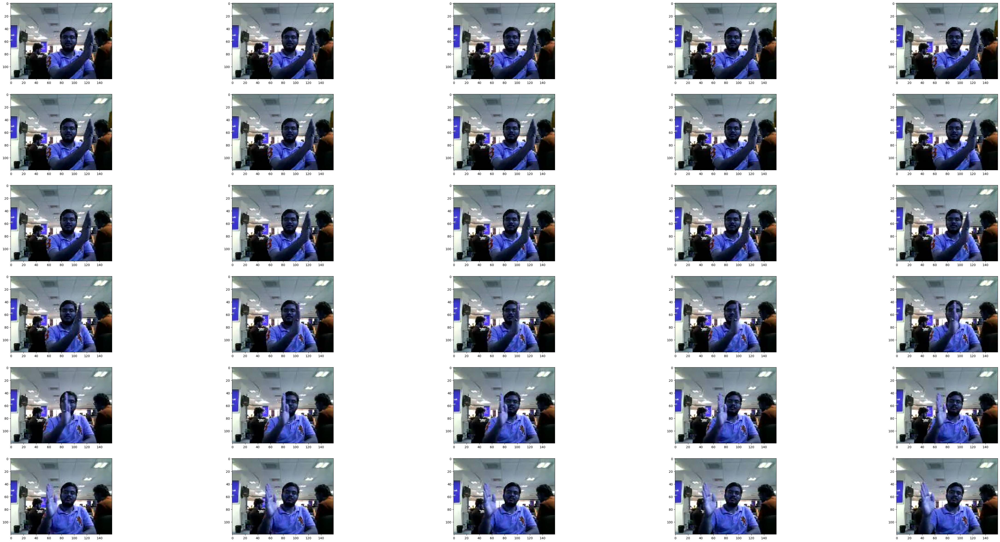

In [51]:
imageset2 = []
for img_path in glob.glob("Project_data/train/WIN_20180926_17_53_03_Pro_Right_Swipe_new/*.png"):
        imageset2.append(imread(img_path))

plt.figure(figsize=(60,30))
index = 0
for i, image in enumerate(imageset2):
    index += 1
    plt.subplot(6,5,index)
    plt.imshow(image)

In [52]:
# Resolutions of existing dataset

height, width, channels = imageset2[0].shape

# Print the resolution
print("Image Resolution:")
print("Width:", width)
print("Height:", height)

Image Resolution:
Width: 160
Height: 120


As we can see, dataset contains images of two different resolutions

## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. 
In the generator, 

you are going to preprocess the images as you have images of 2 different dimensions 

create a batch of video frames. 

You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.


`img_idx` - Selecting frames in multiple of three starting from first frame

In [59]:
# Custom function to crop image 

def crop_img(img, scale=1.0):
    center_x, center_y = img.shape[1] / 2, img.shape[0] / 2
    width_scaled, height_scaled = img.shape[1] * scale, img.shape[0] * scale
    left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
    top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
    img_cropped = img[int(top_y):int(bottom_y), int(left_x):int(right_x)]
    return img_cropped

In [69]:
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    #create a list of image numbers you want to use for a particular video
    img_idx = [1,4,7,10,13,16,19,21,25,28]

    # x is the number of images you use for each video, (y,z) is the final size of the input images 
    x = len(img_idx)
    y = 120
    z = 120

    while True:
        # Shuffle the training dataset
        t = np.random.permutation(folder_list)

        # calculate the number of batches will depend the volume of data and batch size
        num_batches = int(len(t)/batch_size) 

        print(f"Number of batches {num_batches}") 

        # we iterate over the number of batches
        for batch in range(num_batches): 
            print(f"Runing for batch {batch}")

            # 3 is the number of channels RGB
            batch_data = np.zeros((batch_size,x,y,z,3)) 

            # batch_labels is the one hot representation of the output, as we know from problem statement, there can be 5 possible gestures
            batch_labels = np.zeros((batch_size,5)) 
            
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images by 10% as in few cases the detailing of gesture is going closer to the border line of the frame 
                    image = crop_img(image,0.1)
                    
                    # Resize the images based on their dimension as if rectagular images are resized directly their visual may distort 
                    # and hence ignoring 20 point to render a square image
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(y,z),interpolation = cv2.INTER_AREA)
                    else:
                        image = cv2.resize(image,(y,z),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0]/255)
                    batch_data[folder,idx,:,:,1] = (image[:,:,1]/255)
                    batch_data[folder,idx,:,:,2] = (image[:,:,2]/255)
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels, remember what does yield do

        
        # write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            # 3 is the number of channels RGB
            batch_data = np.zeros((batch_size,x,y,z,3)) 

            # batch_labels is the one hot representation of the output, as we know from problem statement, there can be 5 possible gestures
            batch_labels = np.zeros((batch_size,5)) 
            
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images by 10% as in few cases the detailing of gesture is going closer to the border line of the frame 
                    image = crop_img(image,0.1)
                    
                    # Resize the images based on their dimension as if rectagular images are resized directly their visual may distort 
                    # and hence ignoring 20 point to render a square image
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(y,z),interpolation = cv2.INTER_AREA)
                    else:
                        image = cv2.resize(image,(y,z),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0]/255)
                    batch_data[folder,idx,:,:,1] = (image[:,:,1]/255)
                    batch_data[folder,idx,:,:,2] = (image[:,:,2]/255)
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels


Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [60]:
curr_dt_time = datetime.datetime.now()
train_path = 'Project_data/train'
val_path = 'Project_data/val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
num_epochs = 1 # choose the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 1


## Model
Here you make the model using different functionalities that Keras provides. Remember to use `Conv3D` and `MaxPooling3D` and not `Conv2D` and `Maxpooling2D` for a 3D convolution model. You would want to use `TimeDistributed` while building a Conv2D + RNN model. Also remember that the last layer is the softmax. Design the network in such a way that the model is able to give good accuracy on the least number of parameters so that it can fit in the memory of the webcam.

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

#write your model here


Now that you have written the model, the next step is to `compile` the model. When you print the `summary` of the model, you'll see the total number of parameters you have to train.

In [ ]:
optimiser = #write your optimizer
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Let us create the `train_generator` and the `val_generator` which will be used in `.fit_generator`.

In [61]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

The `steps_per_epoch` and `validation_steps` are used by `fit_generator` to decide the number of next() calls it need to make.

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

Let us now fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.

In [ ]:
model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)